In [1]:
# generate toy data
import numpy as np
import time
import warnings

rng = np.random.RandomState(1)

num_samples = 20
#num_samples = 10000

data_x = rng.uniform(low=-4, high=4, size=(num_samples,))
data_y = data_x**3 + rng.normal(loc=0, scale=9, size=(num_samples,))

linspace = np.linspace(-6, 6, num=500)

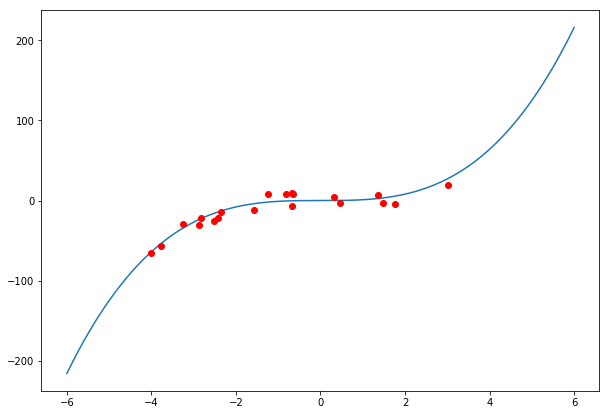

In [2]:
# plot toy data
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 7))
plt.plot(linspace, linspace ** 3)
plt.plot(data_x, data_y, 'ro')
plt.show()

In [3]:
# import some stuff
from __future__ import division, print_function

import os

# set gpu device - only important for multi gpu systems
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
import tensorflow as tf

import tensorflow_probability as tfp
from tensorflow_probability import edward2 as ed

from tqdm import tqdm
import pandas as pd
import layers

In [4]:
hidden = 100
h_units = [16, 32, 64]
# function to build network dependent on mode
def get_net(mode, ops):
    with tf.variable_scope('net'):
        x = tf.placeholder(tf.float32, [None, 1])
        y = tf.placeholder(tf.float32, [None, 1])
        
        pred_mode = tf.placeholder_with_default(False, [])
        
        # build distribution with fixed scale for loss 
        n = tf.distributions.Normal(loc=0., scale=9.)
        
        ops['x'] = x
        ops['y'] = y
        
        ops['pred_mode'] = pred_mode
        
        if mode == 'ensemble':
            adv_alpha = 0.5
            adv_eps = 1e-2
            ops['pred'] = []
            ops['loss'] = []
            ops['adv_loss'] = []
            ops['tot_loss'] = []
            for i in range(10):
                with tf.variable_scope('ens{}'.format(i)):
                    l1 = tf.layers.Dense(units=hidden, activation=tf.nn.relu)
                    l2 = tf.layers.Dense(units=1)
                    
                    x_ = l2(l1(x))

                    # build loss
                    loss = tf.reduce_mean(-1 * n.log_prob(x_ - y))
                    
                    loss_grads = tf.gradients(adv_alpha * loss, x)[0]
                    adv_data = x + adv_eps * tf.sign(loss_grads)

                    adv_pred = l2(l1(adv_data))
                    adv_loss = tf.reduce_mean(-1 * n.log_prob(adv_pred - y))

                    tot_loss = adv_alpha * loss + (1 - adv_alpha) * adv_loss

                ops['pred'].append(x_)
                ops['loss'].append(loss)
                ops['adv_loss'].append(adv_loss)
                ops['tot_loss'].append(tot_loss)
        elif mode == 'hmc':
            print('doing hmc')
            num_results = 30000
            num_burnin_steps = 3000

            def model(x):
                w1 = ed.MultivariateNormalFullCovariance(loc=tf.zeros([1, 100]),
                                                         covariance_matrix=tf.diag(tf.ones([100])), name='w1')
                b1 = ed.MultivariateNormalFullCovariance(loc=tf.zeros([1, 100]),
                                                         covariance_matrix=tf.diag(tf.ones([100])), name='b1')
                
                w2 = ed.MultivariateNormalFullCovariance(loc=tf.zeros([1, 100]),
                                                         covariance_matrix=tf.diag(tf.ones([100])),
                                                         name='w2')
                b2 = ed.MultivariateNormalFullCovariance(loc=tf.zeros([1, 1]),
                                                         covariance_matrix=tf.diag(tf.ones([1])), name='b2')
                
                l1 = tf.nn.relu(tf.matmul(x, w1) + b1)
                w2_t = tf.reshape(w2, [100, 1], name='w2_t')
                y = ed.Normal(loc=(tf.matmul(l1, w2_t) + b2), scale=9., name='y')
                
            ops['model'] = model

            log_joint = ed.make_log_joint_fn(model)
            
            def target_log_prob_fn(w1, b1, w2, b2):
                return log_joint(
                  w1=w1,
                  b1=b1,
                  w2=w2,
                  b2=b2,
                  x=tf.constant(data_x[:, np.newaxis], tf.float32),
                  y=tf.constant(data_y[:, np.newaxis], tf.float32))
            
            ops['inits'] = [tf.placeholder(tf.float32, shape=(1, 100)),
                            tf.placeholder(tf.float32, shape=(1, 100)),
                            tf.placeholder(tf.float32, shape=(1, 100)),
                            tf.placeholder(tf.float32, shape=(1, 1))
                           ]
            
            states, kernel_results = tfp.mcmc.sample_chain(
                num_results=num_results,
                num_burnin_steps=num_burnin_steps,
                num_steps_between_results=3,
                current_state=ops['inits'],
                kernel=tfp.mcmc.HamiltonianMonteCarlo(
                    target_log_prob_fn=target_log_prob_fn,
                    step_size=0.13,
                    num_leapfrog_steps=3))

            ops['states'] = states
            ops['is_accepted'] = kernel_results.is_accepted
        else:
            if 'implicit' in mode:
                h_noise_shape = 1
                aligned_noise = True
                if mode == 'implicit_fullnoise':
                    h_noise_shape = 100
                    aligned_noise = False
                elif mode == 'implicit_fullnoisesh':
                    h_noise_shape = 200
                    aligned_noise = True
                
                
                l1 = layers.BBHDenseLayer('l1', 1, hidden, h_units=h_units, h_use_bias=True,
                                          h_noise_shape=h_noise_shape, aligned_noise=aligned_noise)

                x = l1(x)
                x = tf.nn.relu(x)

                # layer 2
                l2 = layers.BBHDenseLayer('l2', hidden, 1, h_units=h_units, h_use_bias=True,
                                          h_noise_shape=h_noise_shape, aligned_noise=aligned_noise)

                x = l2(x)

                # build loss
                loss = tf.reduce_mean(-1 * n.log_prob(x - y))
            elif mode == 'bbb':

                # layer 1
                l1 = layers.BBBDenseLayer('l1', 1, hidden, init_var=-3.)

                x = l1(x)
                x = tf.nn.relu(x)

                # layer 2
                l2 = layers.BBBDenseLayer('l2', hidden, 1, init_var=-3.)

                x = l2(x)


                kl_loss = tf.add_n(tf.get_collection('bbb_kl'))

                # build loss
                loss = tf.reduce_mean(-1 * n.log_prob(x - y))

                ops['kl_loss'] = kl_loss

            elif mode == 'mnf':
                learn_p = False

                # layer 1
                l1 = layers.MNFDenseLayer('l1', 1, hidden, thres_var=0.5, learn_p=learn_p)

                sample_shape = tf.cond(pred_mode, lambda: tf.constant(1, tf.int32), lambda: tf.shape(x)[0])
                x = l1(x, sample_shape=sample_shape)
                x = tf.nn.relu(x)

                # layer 2
                l2 = layers.MNFDenseLayer('l2', hidden, 1, thres_var=0.5, learn_p=learn_p)
                
                sample_shape = tf.cond(pred_mode, lambda: tf.constant(1, tf.int32), lambda: tf.shape(x)[0])
                x = l2(x, sample_shape)

                # build loss
                loss = tf.reduce_mean(-1 * n.log_prob(x - y))

                kl_loss = tf.add_n(tf.get_collection('mnf_kl'))# / 20.


                ops['kl_loss'] = kl_loss

            elif mode == 'dropout':
                x = tf.layers.dense(inputs=x, units=hidden, activation=tf.nn.relu)
                
                noise_shape = tf.cond(pred_mode, lambda: tf.constant([1, hidden], tf.int32), lambda: tf.shape(x))
                
                x = tf.nn.dropout(x, 0.5, noise_shape=noise_shape)

                x = tf.layers.dense(inputs=x, units=1)
                # build loss
                loss = tf.reduce_mean(-1 * n.log_prob(x - y))
            else:
                w1 = tf.get_variable('map_w1', shape=(1, 100), dtype=tf.float32)
                b1 = tf.get_variable('map_b1', shape=(1, 100), dtype=tf.float32)
                w2 = tf.get_variable('map_w2', shape=(1, 100), dtype=tf.float32)
                b2 = tf.get_variable('map_b2', shape=(1, 1), dtype=tf.float32)
                
                ops['map_weights'] = [w1, b1, w2, b2]
                
                l1 = tf.nn.relu(tf.matmul(x, w1) + b1)
                w2_t = tf.reshape(w2, [100, 1], name='w2_t')
                x = tf.matmul(l1, w2_t) + b2
                # build loss
                loss = tf.reduce_mean(-1 * n.log_prob(x - y))

            ops['pred'] = x
            ops['loss'] = loss
        
        return ops

In [5]:
tfd = tfp.distributions

In [6]:
# dataframe to hold results
cols = ['x', 'y', 'mode', 'mc']

exps = {
    'vanilla': 'MAP', 'implicit_fullkl_structured': 'Bayes by Hypernet',
    'mnf': 'MNF', 'bbb': 'Bayes by Backprop', 
    'dropout': 'MC-Dropout', 'ensemble': 'Ensemble',
    'implicit_fullnoise': 'Bayes by Hypernet with Full Noise',
    'implicit_fullkl': 'Bayes by Hypernet with Full KL',
    'hmc': 'Hamiltonian Monte Carlo'
    }

weight_dict = {}

prediction_df = pd.DataFrame(columns=cols)
for mode in exps.keys():
    print(mode)

    tf.reset_default_graph()
    tf.set_random_seed(1)
    
    ops = {}

    # get network ops
    ops = get_net(mode, ops)

    net_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, 'net')

    if mode == 'implict':
        lr = 0.02
    elif 'implicit' in mode:
        lr = 0.01
    else:
        lr = 0.1

    opt = tf.train.AdamOptimizer(lr, epsilon=1e-5)
    
    anneal = tf.placeholder_with_default(1., [])

    if 'implicit' in mode: # build custom training ops for implicit
        num_samples = 5

        gen_weights = tf.concat(
            [tf.transpose(t, [1, 0])
             for t in tf.get_collection('weight_samples')], 0)
        ops['all_weights'] = gen_weights
        
        if 'struc' in mode:
            n = tf.shape(gen_weights)[0]
            mu = tf.ones((n, ))
            
            f1 = tf.concat([tf.ones((tf.cast((n * (n + 1)) / 2 - 100, tf.int32),)), tf.zeros((100,))], 0)
            scale_tril1 = tf.eye(n) + tfd.fill_triangular(f1)
            d1 = tfd.MultivariateNormalTriL(loc=mu, scale_tril=scale_tril1)
            
            f2 = tf.concat([tf.zeros((tf.cast((n * (n + 1)) / 2 - 100, tf.int32),)), tf.ones((100,))], 0)
            scale_tril2 = tf.eye(n) + tfd.fill_triangular(f2)
            d2 = tfd.MultivariateNormalTriL(loc=-1 * mu, scale_tril=scale_tril2)
            
            tfd = tfp.distributions
            mix = 0.5
            bimix_gauss = tfd.Mixture(
              cat=tfd.Categorical(probs=[mix, 1.-mix]),
              components=[
                d1, d2
            ])
            prior_samples = tf.transpose(bimix_gauss.sample(num_samples), [1, 0])
        else:
            prior = tf.distributions.Normal(loc=0., scale=1.)
            prior_samples = prior.sample(tf.shape(gen_weights))
        
        wp_distances = tf.square(
            tf.expand_dims(prior_samples, 2)
            - tf.expand_dims(gen_weights, 1))
        # [weights, samples, samples]

        ww_distances = tf.square(
            tf.expand_dims(gen_weights, 2)
            - tf.expand_dims(gen_weights, 1))
        
        if 'full' in mode:
            wp_distances = tf.sqrt(tf.reduce_sum(wp_distances, 0) + 1e-8)
            wp_dist = tf.reduce_min(wp_distances, 0)

            ww_distances = tf.sqrt(
                tf.reduce_sum(ww_distances, 0) + 1e-8) + tf.eye(num_samples) * 1e10
            ww_dist = tf.reduce_min(ww_distances, 0)

            # mean over samples
            kl = tf.cast(tf.shape(gen_weights)[0], tf.float32) * tf.reduce_mean(
                tf.log(wp_dist / (ww_dist + 1e-8) + 1e-8)
                + tf.log(float(num_samples) / (num_samples - 1)))
        else:
            wp_distances = tf.sqrt(wp_distances + 1e-8)
            wp_dist = tf.reduce_min(wp_distances, 1)

            ww_distances = tf.sqrt(ww_distances + 1e-8) + tf.expand_dims(
                tf.eye(num_samples) * 1e10, 0)
            ww_dist = tf.reduce_min(ww_distances, 1)

            # sum over weights, mean over samples
            kl = tf.reduce_sum(tf.reduce_mean(
                tf.log(wp_dist / (ww_dist + 1e-8) + 1e-8)
                + tf.log(float(num_samples) / (num_samples - 1)), 1))
        

        loss_g = ops['loss'] + anneal * kl
        
        ops['kl_loss'] = kl

        gvs = opt.compute_gradients(loss_g)
        optimiser = opt.apply_gradients(gvs)
    elif mode == 'bbb' or mode == 'mnf':
        optimiser = opt.minimize(ops['loss'] + anneal * ops['kl_loss'])
        
        all_weights = tf.concat(
            [tf.transpose(t, [1, 0])
             for t in tf.get_collection('weight_samples')], 0)
        ops['all_weights'] = all_weights
    elif mode == 'ensemble':
        optimiser = [opt.minimize(tot_loss) for tot_loss in ops['tot_loss']]
    elif mode == 'hmc':
        pass
    else:
        optimiser = opt.minimize(ops['loss'])

    # build function to hold predictions
    # pred = ops['pred']

    # build op to initialise the variables
    init = tf.global_variables_initializer()

    numerics = tf.no_op()  # tf.add_check_numerics_ops()
    
    s = tf.Session()

    # initialise the weights
    s.run(init)
    

    from tqdm import trange
    num_epochs = 200 if ('implicit' in mode and mode != 'implicit') else 40
    with trange(num_epochs) as pbar: # run for 40 epochs
        for i in pbar: #300 epochs
            # get batch from dataset
            if 'implicit' in mode or mode == 'bbb' or mode == 'mnf':
                cur_anneal = np.clip(10. / (i + 1) - 1., 0., 1.)
                l_loss, kl_loss, _ = s.run([ops['loss'], ops['kl_loss'], optimiser],
                                          feed_dict={ops['x']: data_x[:, np.newaxis],
                                                     ops['y']: data_y[:, np.newaxis],
                                                     anneal: cur_anneal
                                                    })
                pbar.set_postfix(ce=l_loss, kl_loss=kl_loss)
            elif mode == 'ensemble':
                ce = 0
                for loss, opt in zip(ops['loss'], optimiser):
                    l_loss, _ = s.run([loss, opt],
                                      feed_dict={ops['x']: data_x[:, np.newaxis],
                                                 ops['y']: data_y[:, np.newaxis]})
                    ce += l_loss / 10
                pbar.set_postfix(ce=ce)
            elif mode == 'hmc':
                pass
            else:
                l_loss, _ = s.run([ops['loss'], optimiser],
                                  feed_dict={ops['x']: data_x[:, np.newaxis],
                                             ops['y']: data_y[:, np.newaxis]})

                pbar.set_postfix(ce=l_loss)
        pbar.close()

    if mode == 'hmc':
        w1 = b1 = w2 = b2 = None 
        for restart in range(1):
            states_, is_accepted = s.run([ops['states'], ops['is_accepted']],
                                         feed_dict={k: v for k, v in zip(ops['inits'], weight_dict['vanilla'])})
            print(np.sum(is_accepted) / float(len(states_[0])))
            # init at map, run samples, burn in & thinning -> 
            # check heuristic effective sampel size?
            w1_, b1_, w2_, b2_ = states_
            print('done hmc')
            
            if w1 is None:
                w1, b1, w2, b2 = states_
            else:
                w1 = np.concatenate([w1, w1_], 0)
                b1 = np.concatenate([b1, b1_], 0)
                w2 = np.concatenate([w2, w2_], 0)
                b2 = np.concatenate([b2, b2_], 0)
    
    # run predictions after training
    all_preds = np.zeros(len(linspace))
    if mode == 'dropout' or 'implicit' in mode or mode == 'bbb' or mode == 'mnf':
        mcsteps = 100
        
        for mc in range(mcsteps):
            predictions = s.run(ops['pred'], {ops['x']: linspace[:, np.newaxis], ops['pred_mode']: True})[:, 0]
            all_preds += predictions / mcsteps
            new_df = pd.DataFrame(columns=cols, data=list(zip(
                    linspace, predictions, [mode]*len(linspace), [mc]*len(linspace))))
            
            prediction_df = pd.concat([prediction_df, new_df])
    elif mode == 'ensemble':
        for i, pred in enumerate(ops['pred']):
            predictions = s.run(pred, {ops['x']: linspace[:, np.newaxis]})[:, 0]
            all_preds += predictions / 10
            new_df = pd.DataFrame(columns=cols, data=list(zip(
                    linspace, predictions, [mode]*len(linspace), [i]*len(linspace))))
            
            prediction_df = pd.concat([prediction_df, new_df])
    elif mode == 'hmc':
        mcsteps = len(w1)
        print('predicting hmc')
        for mc in trange(mcsteps):
            predictions = np.matmul(np.maximum(0, (np.matmul(linspace[:, np.newaxis], w1[mc]) + b1[mc])), np.swapaxes(w2[mc], 1, 0)) + b2[mc]
            predictions = predictions[:, 0]
            all_preds += predictions / mcsteps
            new_df = pd.DataFrame(columns=cols, data=list(zip(
                    linspace, predictions, [mode]*len(linspace), [mc]*len(linspace))))
            
            prediction_df = pd.concat([prediction_df, new_df])
    else:
        predictions = s.run(ops['pred'], {ops['x']: linspace[:, np.newaxis]})[:, 0]
        all_preds += predictions
        new_df = pd.DataFrame(columns=cols, data=list(zip(linspace, predictions,
                                                     [mode]*len(linspace), [0]*len(linspace))))
        
        prediction_df = pd.concat([prediction_df, new_df])
    
    print(np.sqrt(np.mean((all_preds - linspace ** 3)**2)))
    
    if 'implicit' in mode or mode == 'bbb' or mode == 'mnf':
        weights = np.zeros((5000, 200))
        num_sample_runs = weights.shape[0] // 5

        for wsample in range(num_sample_runs):
            if mode == 'mnf':
                weights[wsample*5:(wsample+1)*5] = np.swapaxes(s.run(ops['all_weights']), 1, 0)
            else:
                samples = s.run(tf.get_collection('weight_samples'))
                w1 = samples[0]
                w2 = samples[2]
                weights[wsample*5:(wsample+1)*5, :100] = w1
                weights[wsample*5:(wsample+1)*5, 100:] = w2
        weight_dict[mode] = weights
    elif mode == 'hmc':
        weight_dict[mode] = np.concatenate([w1.squeeze(), w2.squeeze()], 1)
    elif mode == 'vanilla':
        weight_dict[mode] = s.run(ops['map_weights'])
        
    s.close()
        
prediction_df['title'] = [exps[f] for f in prediction_df['mode']]

vanilla


100%|██████████| 40/40 [00:00<00:00, 141.13it/s, ce=3.37]


40.60612387113658
implicit_fullkl_structured


100%|██████████| 200/200 [00:01<00:00, 175.82it/s, ce=3.83, kl_loss=637]   


63.5151528055535
mnf


100%|██████████| 40/40 [00:01<00:00, 32.41it/s, ce=5.24, kl_loss=8556.95]


71.07433288261085
bbb


100%|██████████| 40/40 [00:00<00:00, 217.62it/s, ce=3.72, kl_loss=139]


68.64405920263395


  0%|          | 0/40 [00:00<?, ?it/s, ce=4.35]

dropout


100%|██████████| 40/40 [00:00<00:00, 409.19it/s, ce=3.68]


52.549467023838375
ensemble


100%|██████████| 40/40 [00:01<00:00, 23.30it/s, ce=3.33]


30.493928396156647
implicit_fullnoise


100%|██████████| 200/200 [00:01<00:00, 163.60it/s, ce=4.86, kl_loss=319]


59.961466837900765
implicit_fullkl


100%|██████████| 200/200 [00:00<00:00, 23.40it/s, ce=3.63, kl_loss=851]    


63.74486997879365
hmc
doing hmc


  0%|          | 6/30000 [00:00<08:35, 58.22it/s]

0.7413333333333333
done hmc
predicting hmc


100%|██████████| 30000/30000 [3:58:04<00:00,  1.09it/s]  


61.58326405776418


In [11]:
len(exps)

9

In [8]:
colours = sns.color_palette(n_colors=9)

In [9]:
#t = {'mnf': 'MNF', 'bbb': 'Bayes by Backprop', 'implicit': 'Bayes by Hypernet',
#     'dropout': 'MC-Dropout', 'vanilla': 'MAP', 'ensemble': 'Ensemble'}

prediction_df['title'] = [exps[f] for f in prediction_df['mode']]

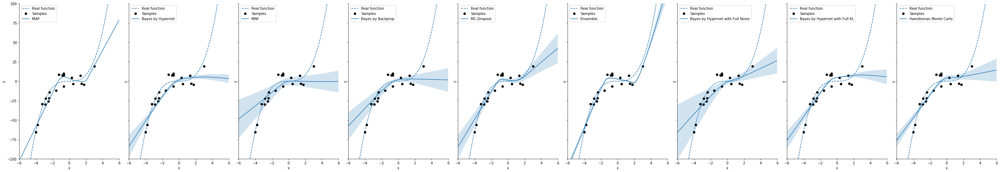

In [10]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fig, axes = plt.subplots(1, 9, figsize=(40, 7), sharey=True)
    for i, (mode, label) in enumerate(exps.items()):
        mode_df = prediction_df[prediction_df['mode'] == mode]
        #axes[i].set_title(label)
        axes[i].plot(linspace, linspace ** 3, '--', label='Real function')
        axes[i].plot(data_x, data_y, 'o', color='black', label='Samples')
        sns.tsplot(mode_df, time='x', value='y', condition='title', unit='mc', ci='sd', ax=axes[i])
        l = axes[i].legend(loc=0)
        l.set_title('')
    plt.ylim(-100, 100)
    sns.despine()
    plt.tight_layout()
    plt.show()

In [18]:
colours = sns.color_palette(n_colors=9)

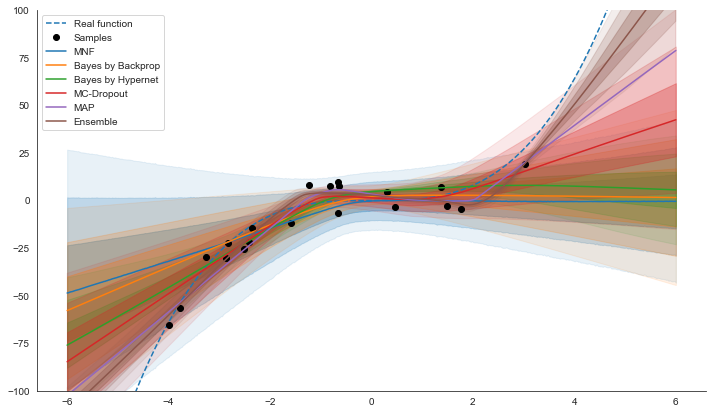

In [15]:


plt.figure(figsize=(12, 7))
plt.plot(linspace, linspace ** 3, '--', label='Real function')
plt.plot(data_x, data_y, 'o', color='black', label='Samples')
for i, (mode, label) in enumerate(t.items()):
    mode_df = prediction_df[prediction_df['mode'] == mode]
    groups = mode_df.groupby(['x'])
    mean_pred = groups.mean().values[:, 0]
    std_pred = groups.std().values[:, 0]
    plt.plot(linspace, mean_pred, color=colours[i], label=label)
    
    if not mode == 'vanilla':
        plt.fill_between(linspace,
                         mean_pred + 1 * std_pred,
                         mean_pred - 1 * std_pred,
                         color=colours[i], alpha=0.3)
        plt.fill_between(linspace,
                         mean_pred + 2 * std_pred,
                         mean_pred - 2 * std_pred,
                         color=colours[i], alpha=0.2)
        plt.fill_between(linspace,
                         mean_pred + 3 * std_pred,
                         mean_pred - 3 * std_pred,
                         color=colours[i], alpha=0.1)
plt.ylim(-100, 100)
l = plt.legend(loc=0)
l.set_title('')
sns.despine()
plt.show()

In [17]:
len(exps.keys())

9

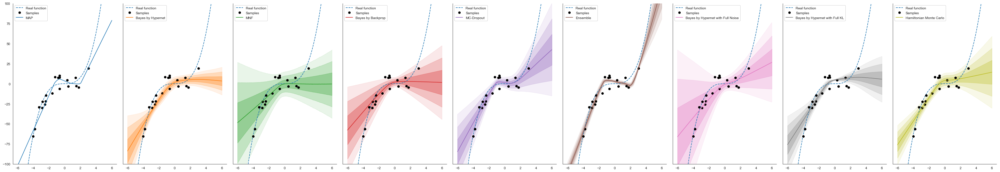

In [19]:
fig, axes = plt.subplots(1, 9, figsize=(40, 7), sharey=True)
for i, (mode, label) in enumerate(exps.items()):
    #axes[i].set_title(label)
    axes[i].plot(linspace, linspace ** 3, '--', label='Real function')
    axes[i].plot(data_x, data_y, 'o', color='black', label='Samples')
    
    mode_df = prediction_df[prediction_df['mode'] == mode]
    groups = mode_df.groupby(['x'])
    mean_pred = groups.mean().values[:, 0]
    std_pred = groups.std().values[:, 0]
    axes[i].plot(linspace, mean_pred, color=colours[i], label=label)
    
    if not mode == 'vanilla':
        axes[i].fill_between(linspace,
                         mean_pred + 1 * std_pred,
                         mean_pred - 1 * std_pred,
                         color=colours[i], alpha=0.3)
        axes[i].fill_between(linspace,
                         mean_pred + 2 * std_pred,
                         mean_pred - 2 * std_pred,
                         color=colours[i], alpha=0.2)
        axes[i].fill_between(linspace,
                         mean_pred + 3 * std_pred,
                         mean_pred - 3 * std_pred,
                         color=colours[i], alpha=0.1)
        
    l = axes[i].legend(loc=0)
    l.set_title('')
plt.ylim(-100, 100)
sns.despine()
plt.tight_layout()
plt.show()

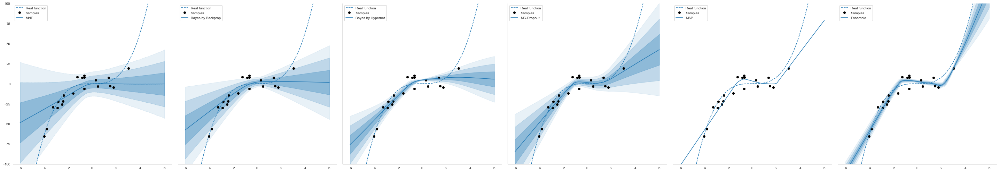

In [21]:
fig, axes = plt.subplots(1, 6, figsize=(40, 7), sharey=True)
for i, (mode, label) in enumerate(t.items()):
    #axes[i].set_title(label)
    axes[i].plot(linspace, linspace ** 3, '--', label='Real function')
    axes[i].plot(data_x, data_y, 'o', color='black', label='Samples')
    
    mode_df = prediction_df[prediction_df['mode'] == mode]
    groups = mode_df.groupby(['x'])
    mean_pred = groups.mean().values[:, 0]
    std_pred = groups.std().values[:, 0]
    axes[i].plot(linspace, mean_pred, color=colours[0], label=label)
    
    if not mode == 'vanilla':
        axes[i].fill_between(linspace,
                         mean_pred + 1 * std_pred,
                         mean_pred - 1 * std_pred,
                         color=colours[0], alpha=0.3)
        axes[i].fill_between(linspace,
                         mean_pred + 2 * std_pred,
                         mean_pred - 2 * std_pred,
                         color=colours[0], alpha=0.2)
        axes[i].fill_between(linspace,
                         mean_pred + 3 * std_pred,
                         mean_pred - 3 * std_pred,
                         color=colours[0], alpha=0.1)
        
    l = axes[i].legend(loc=0)
    l.set_title('')
plt.ylim(-100, 100)
sns.despine()
plt.tight_layout()
plt.show()

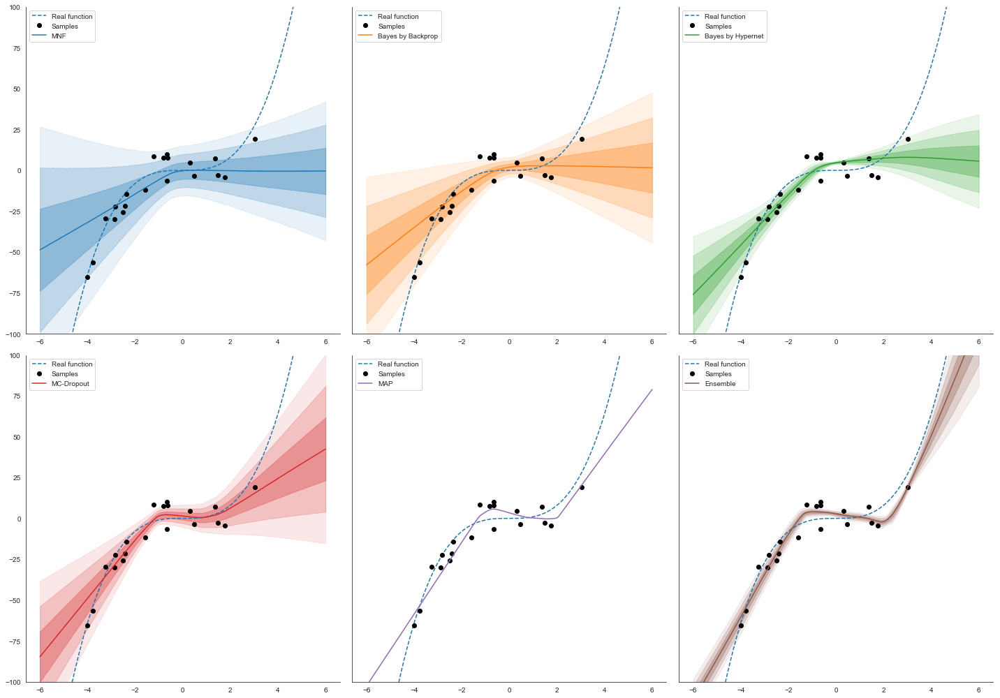

In [22]:
fig, axes = plt.subplots(2, 3, figsize=(20, 14), sharey=True)
for i, (mode, label) in enumerate(t.items()):
    row = i // 3
    col = i % 3
    #axes[row, col].set_title(label)
    axes[row, col].plot(linspace, linspace ** 3, '--', label='Real function')
    axes[row, col].plot(data_x, data_y, 'o', color='black', label='Samples')
    
    mode_df = prediction_df[prediction_df['mode'] == mode]
    groups = mode_df.groupby(['x'])
    mean_pred = groups.mean().values[:, 0]
    std_pred = groups.std().values[:, 0]
    axes[row, col].plot(linspace, mean_pred, color=colours[i], label=label)
    
    if not mode == 'vanilla':
        axes[row, col].fill_between(linspace,
                         mean_pred + 1 * std_pred,
                         mean_pred - 1 * std_pred,
                         color=colours[i], alpha=0.3)
        axes[row, col].fill_between(linspace,
                         mean_pred + 2 * std_pred,
                         mean_pred - 2 * std_pred,
                         color=colours[i], alpha=0.2)
        axes[row, col].fill_between(linspace,
                         mean_pred + 3 * std_pred,
                         mean_pred - 3 * std_pred,
                         color=colours[i], alpha=0.1)
        
    l = axes[row, col].legend(loc=0)
    l.set_title('')
plt.ylim(-100, 100)
sns.despine()
plt.tight_layout()
plt.show()

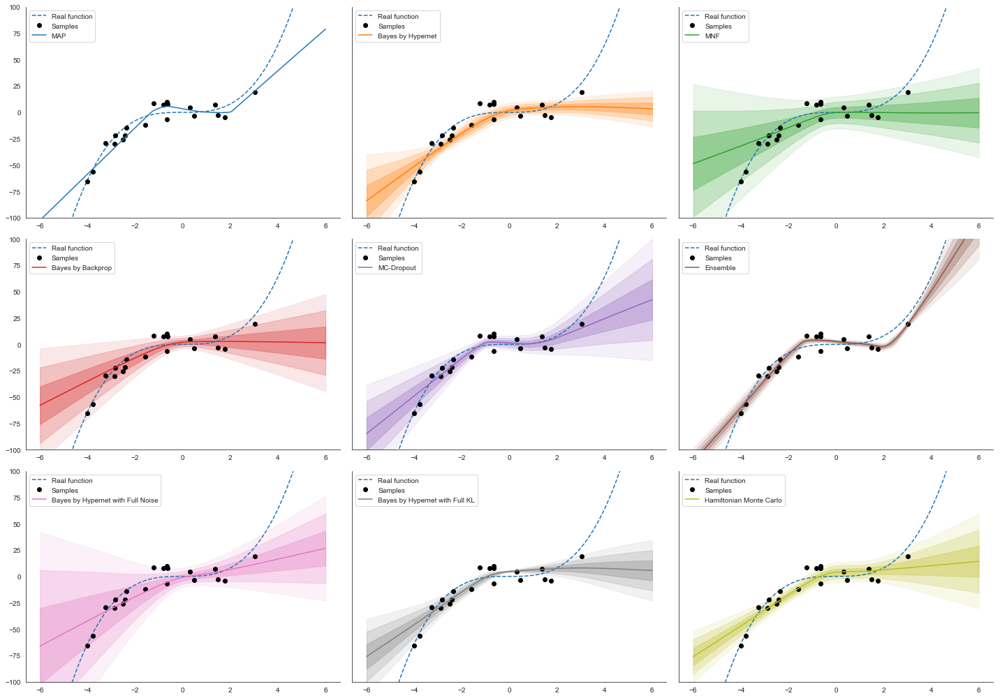

In [23]:
fig, axes = plt.subplots(3, 3, figsize=(20, 14), sharey=True)
for i, (mode, label) in enumerate(exps.items()):
    row = i // 3
    col = i % 3
    #axes[row, col].set_title(label)
    axes[row, col].plot(linspace, linspace ** 3, '--', label='Real function')
    axes[row, col].plot(data_x, data_y, 'o', color='black', label='Samples')
    
    mode_df = prediction_df[prediction_df['mode'] == mode]
    groups = mode_df.groupby(['x'])
    mean_pred = groups.mean().values[:, 0]
    std_pred = groups.std().values[:, 0]
    axes[row, col].plot(linspace, mean_pred, color=colours[i], label=label)
    
    if not mode == 'vanilla':
        axes[row, col].fill_between(linspace,
                         mean_pred + 1 * std_pred,
                         mean_pred - 1 * std_pred,
                         color=colours[i], alpha=0.3)
        axes[row, col].fill_between(linspace,
                         mean_pred + 2 * std_pred,
                         mean_pred - 2 * std_pred,
                         color=colours[i], alpha=0.2)
        axes[row, col].fill_between(linspace,
                         mean_pred + 3 * std_pred,
                         mean_pred - 3 * std_pred,
                         color=colours[i], alpha=0.1)
        
    l = axes[row, col].legend(loc=0)
    l.set_title('')
plt.ylim(-100, 100)
sns.despine()
plt.tight_layout()
plt.show()

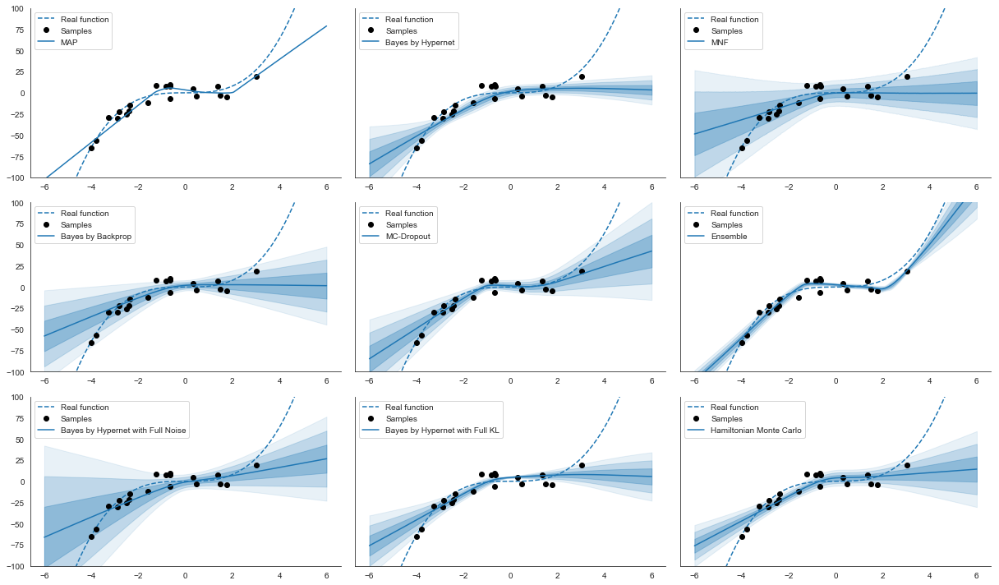

In [24]:
fig, axes = plt.subplots(3, 3, figsize=(17, 10), sharey=True)
for i, (mode, label) in enumerate(exps.items()):
    row = i // 3
    col = i % 3
    #axes[row, col].set_title(label)
    axes[row, col].plot(linspace, linspace ** 3, '--', label='Real function')
    axes[row, col].plot(data_x, data_y, 'o', color='black', label='Samples')
    
    mode_df = prediction_df[prediction_df['mode'] == mode]
    groups = mode_df.groupby(['x'])
    mean_pred = groups.mean().values[:, 0]
    std_pred = groups.std().values[:, 0]
    axes[row, col].plot(linspace, mean_pred, color=colours[0], label=label)
    
    if not mode == 'vanilla':
        axes[row, col].fill_between(linspace,
                         mean_pred + 1 * std_pred,
                         mean_pred - 1 * std_pred,
                         color=colours[0], alpha=0.3)
        axes[row, col].fill_between(linspace,
                         mean_pred + 2 * std_pred,
                         mean_pred - 2 * std_pred,
                         color=colours[0], alpha=0.2)
        axes[row, col].fill_between(linspace,
                         mean_pred + 3 * std_pred,
                         mean_pred - 3 * std_pred,
                         color=colours[0], alpha=0.1)
        
    l = axes[row, col].legend(loc=0)
    l.set_title('')
plt.ylim(-100, 100)
sns.despine()
plt.tight_layout()
plt.show()

BbH struc. prior


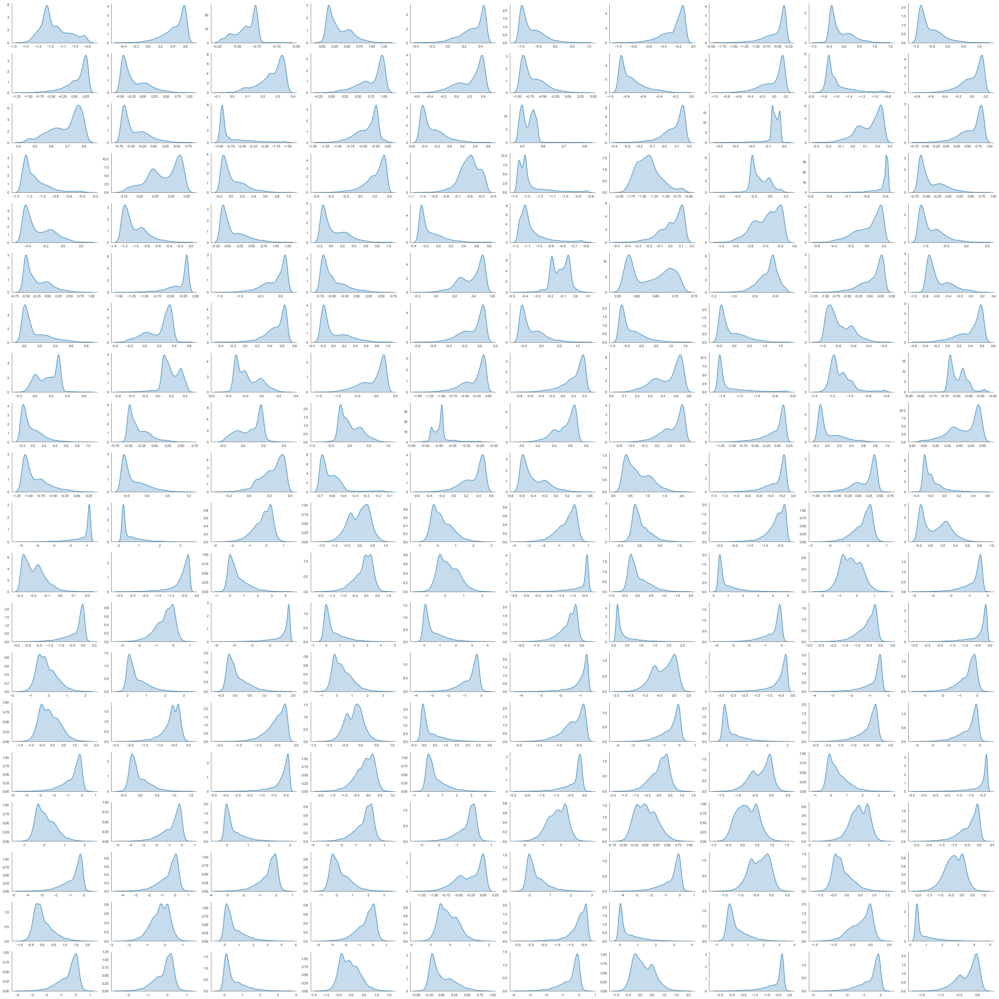

MNF


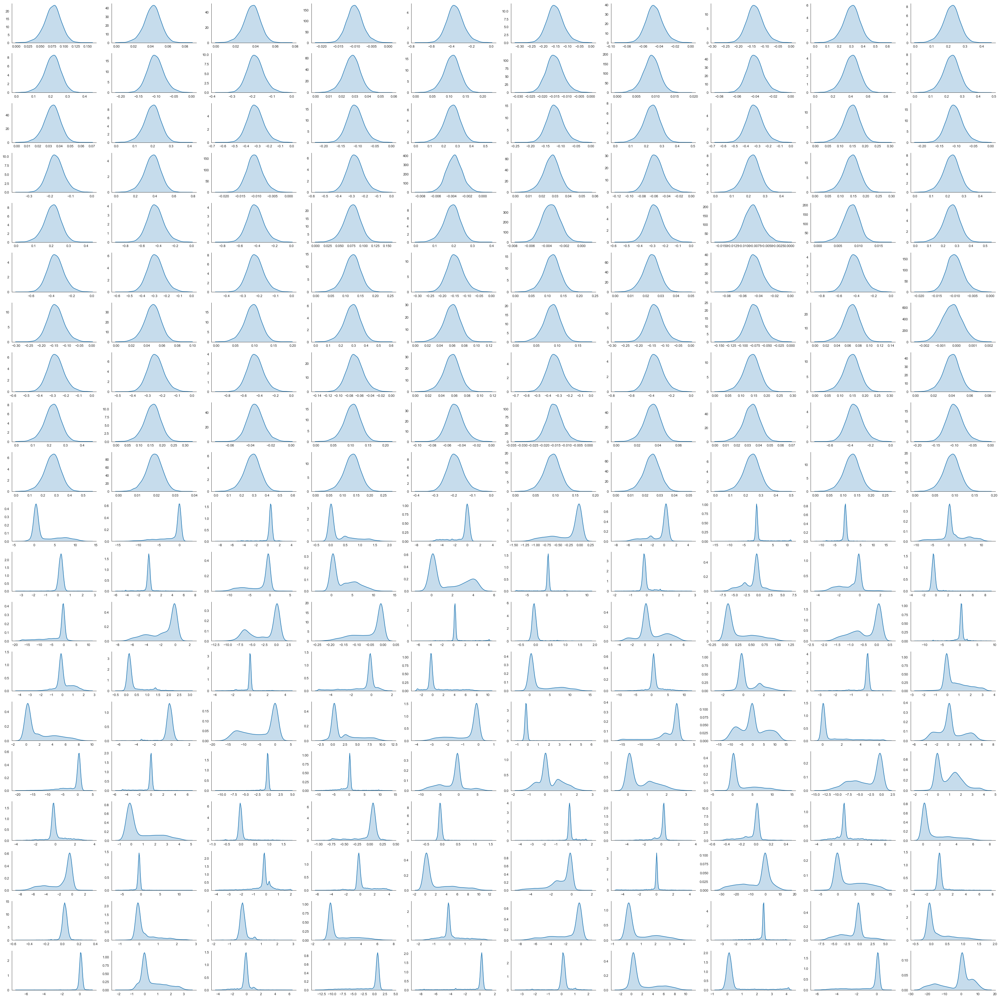

Bayes by Backprop


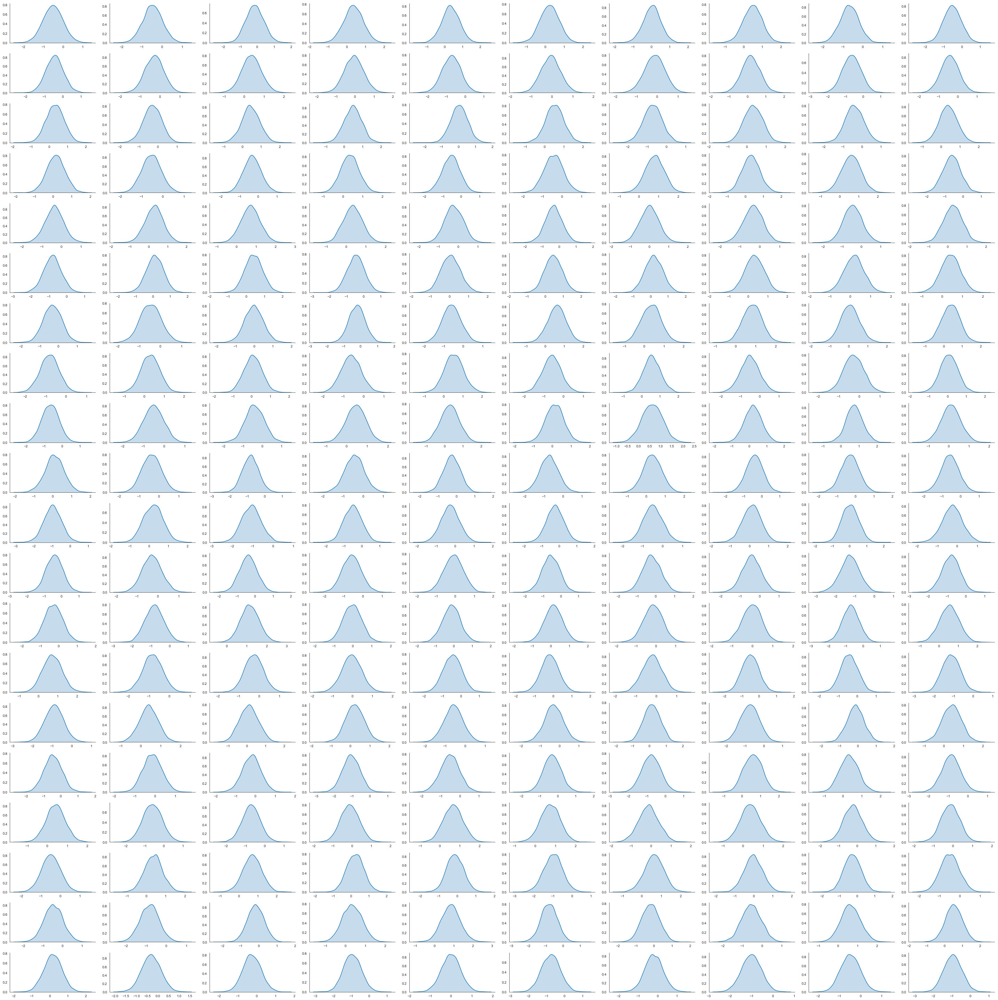

BbH full noise


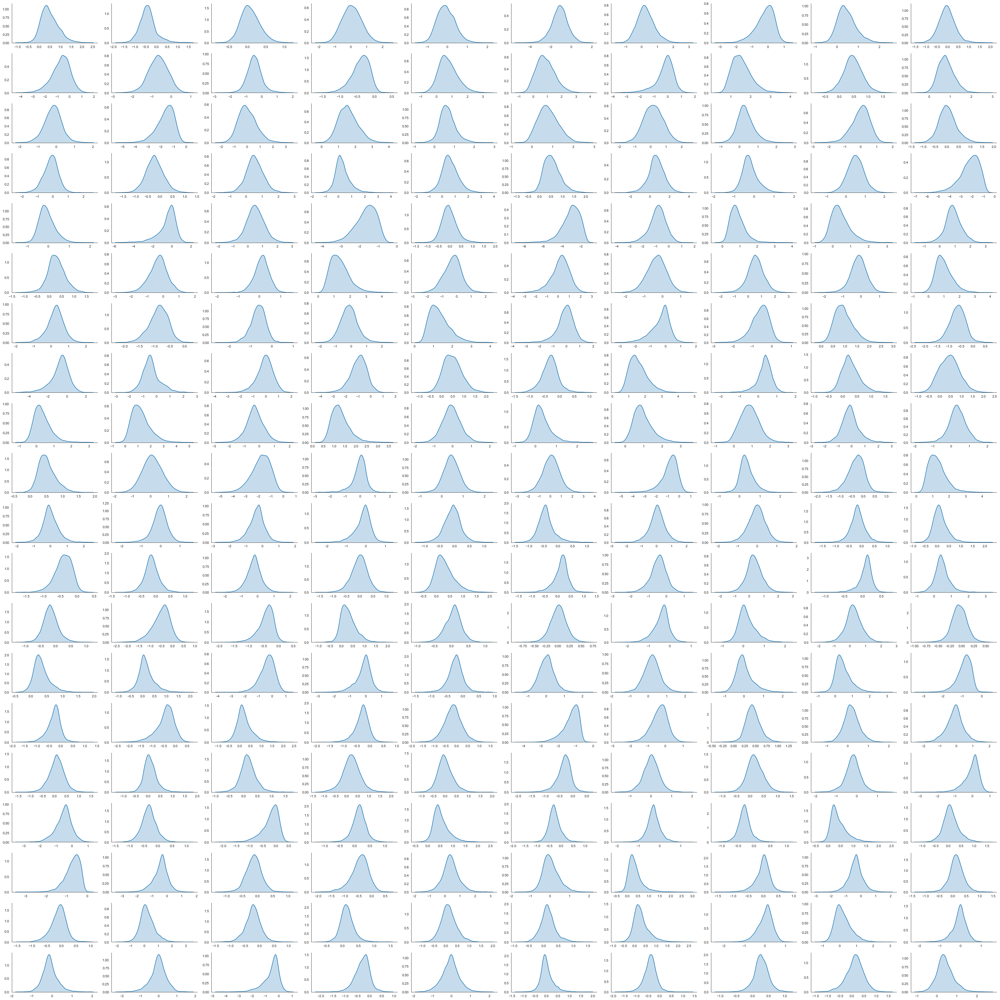

BbH with Full KL


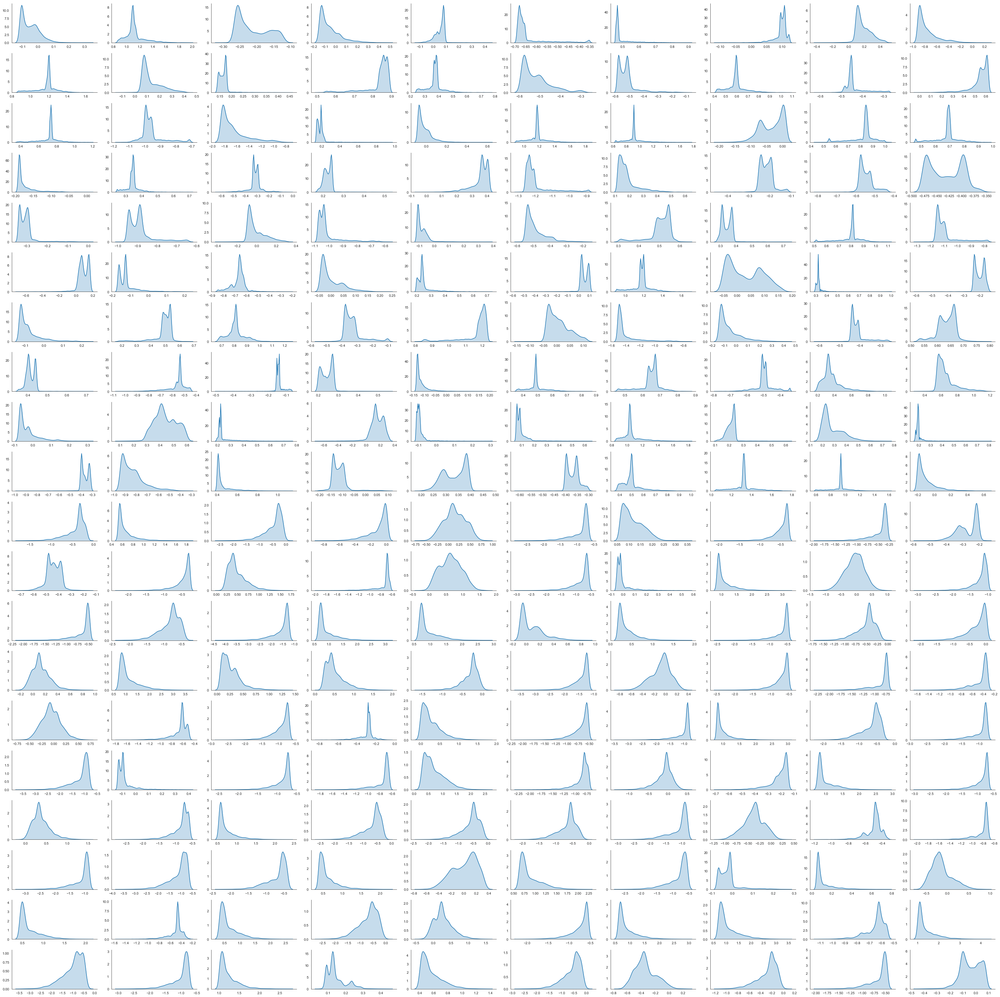

HMC


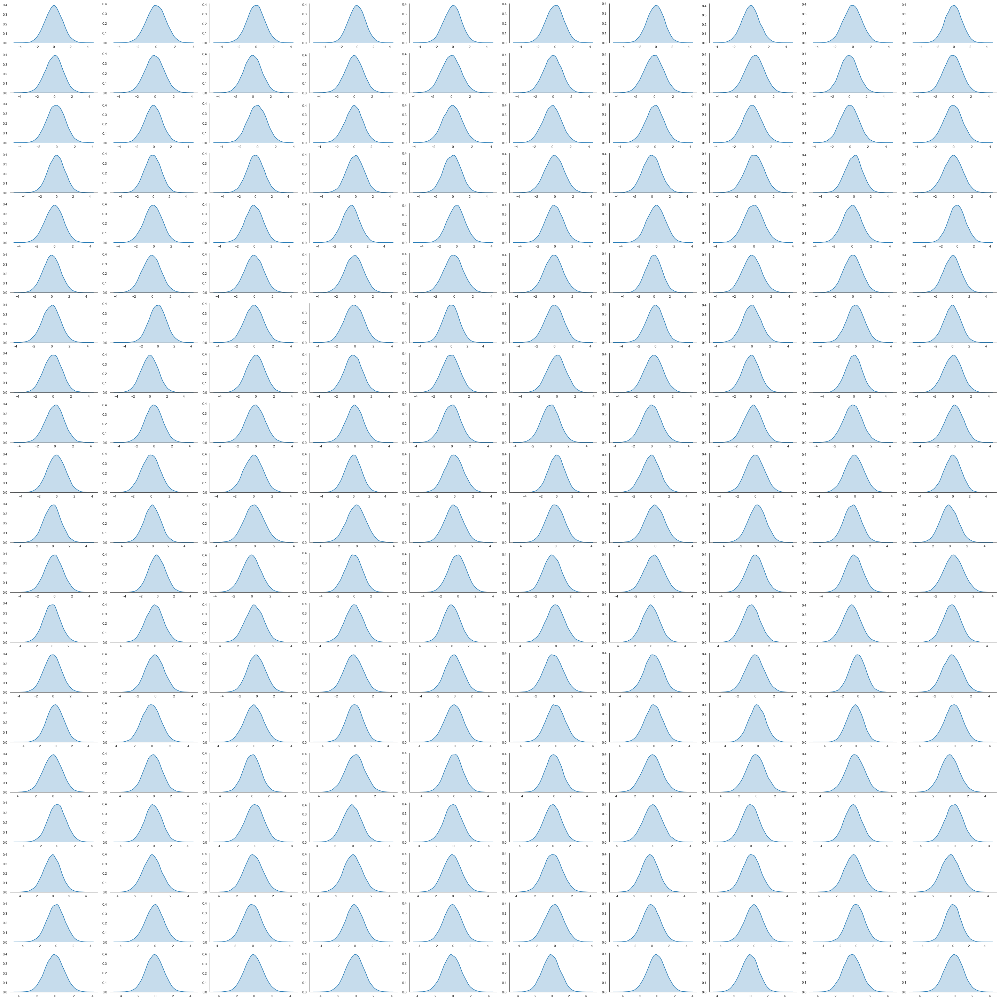

In [33]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for key in weight_dict.keys():
        if key == 'MAP' or key == 'vanilla':
            continue
        print(exps[key])
        weight_dist = np.squeeze(np.array(weight_dict[key]))

        fig, axes = plt.subplots(20, 10, figsize=(40, 40), sharey=False)
        for i in range(200):
            row = i // 10
            col = i % 10

            sns.kdeplot(weight_dist[:, i], ax=axes[row, col], shade=True)
        plt.tight_layout()
        sns.despine()
        plt.show()

In [ ]:
### more data - 3k HMC samples

MAP
BbH struc. prior


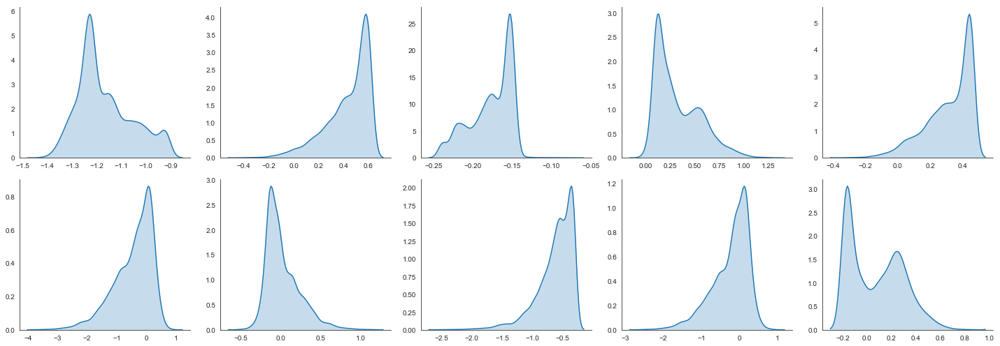

MNF


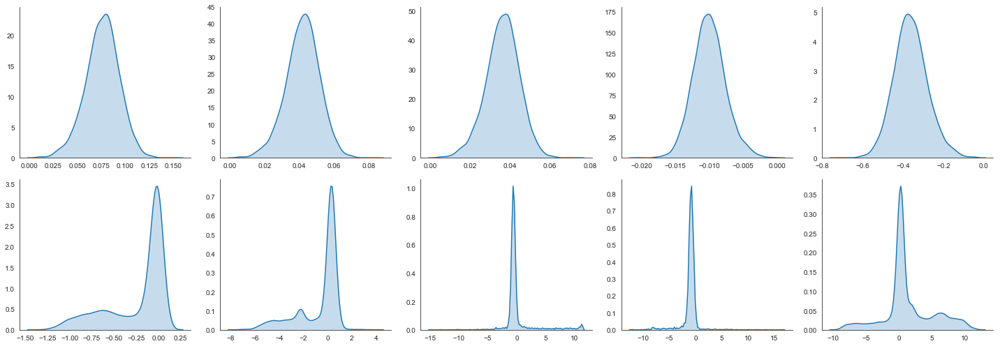

Bayes by Backprop


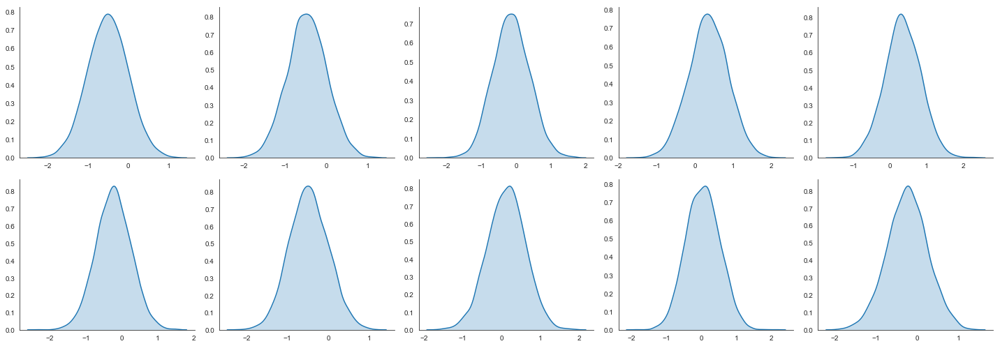

BbH full noise


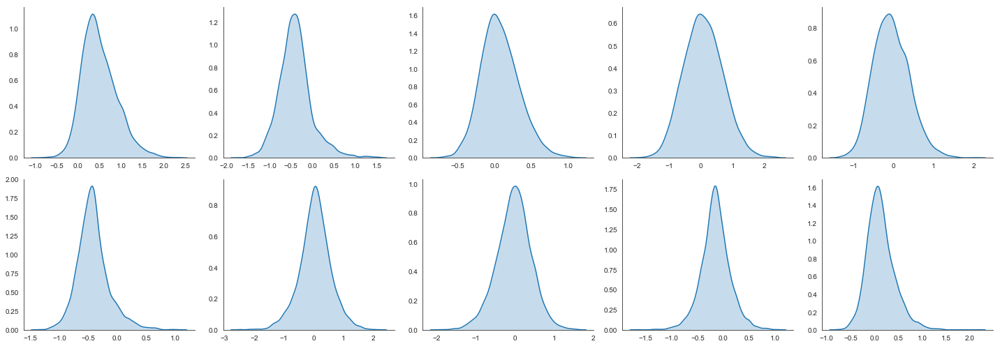

BbH with Full KL


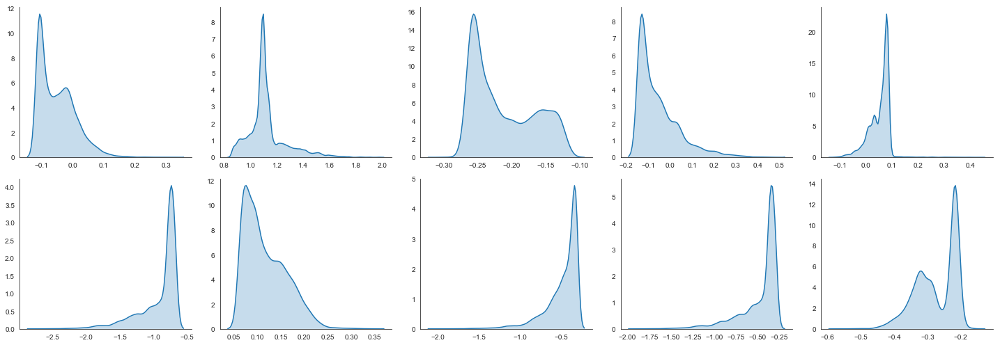

HMC


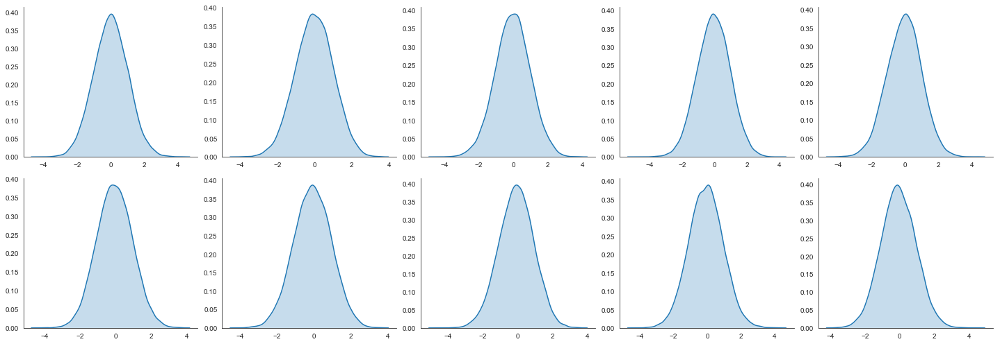

In [35]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for key in weight_dict.keys():
        print(exps[key])
        if key == 'MAP' or key == 'vanilla':
            continue
        weight_dist = np.squeeze(np.array(weight_dict[key]))

        fig, axes = plt.subplots(2, 5, figsize=(20, 7), sharey=False)
        for i in range(10):
            row = i // 5
            col = i % 5

            sns.kdeplot(weight_dist[:, i + row * 100].astype(np.float32), ax=axes[row, col], shade=True)
        sns.despine()
        plt.tight_layout()
        plt.show()

MAP
BbH struc. prior


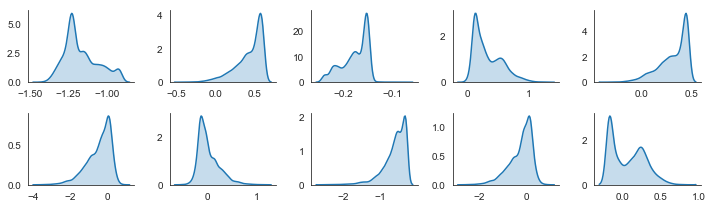

MNF


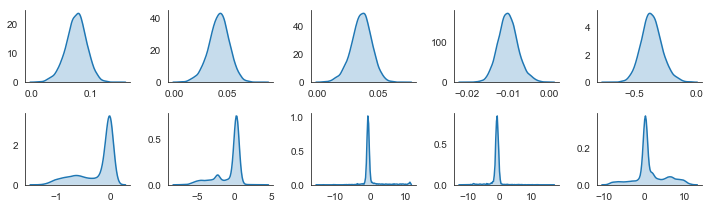

Bayes by Backprop


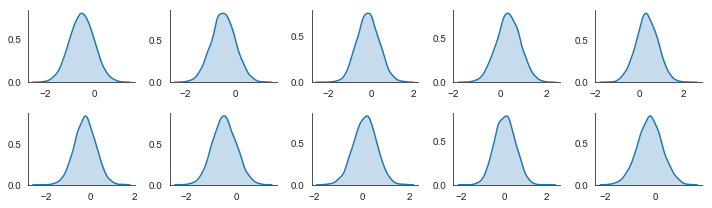

BbH full noise


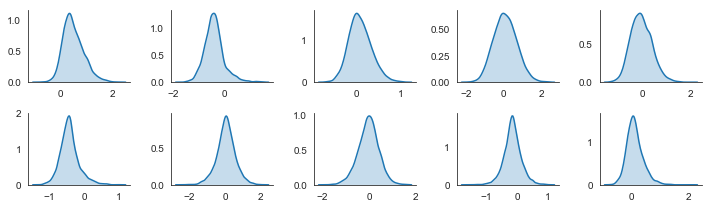

BbH with Full KL


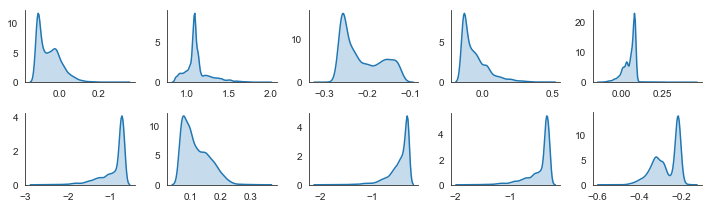

HMC


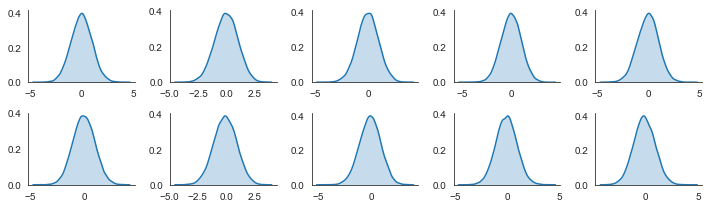

In [36]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for key in weight_dict.keys():
        print(exps[key])
        if key == 'MAP' or key == 'vanilla':
            continue
        weight_dist = np.squeeze(np.array(weight_dict[key]))

        fig, ax = plt.subplots(2, 5, figsize=(10, 3))
        for i in range(10):
            row = i // 5
            col = i % 5

            sns.kdeplot(weight_dist[:, i + row * 100].astype(np.float32), ax=ax[row, col], shade=True)
        sns.despine()
        plt.tight_layout()
        plt.show()

vanilla
implicit_fullkl_structured
(200, 200)


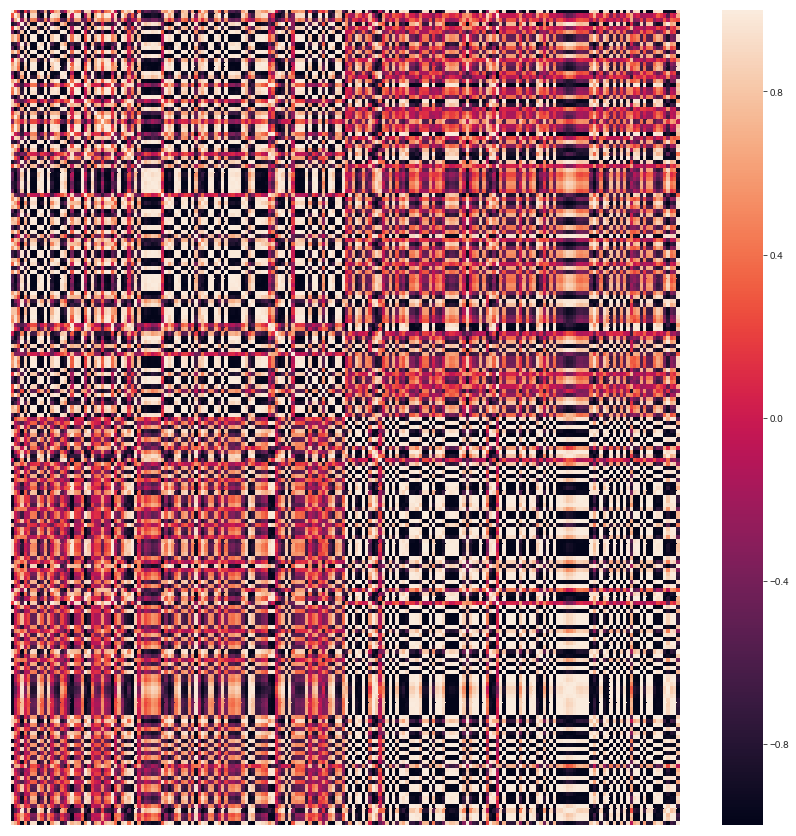

mnf
(200, 200)


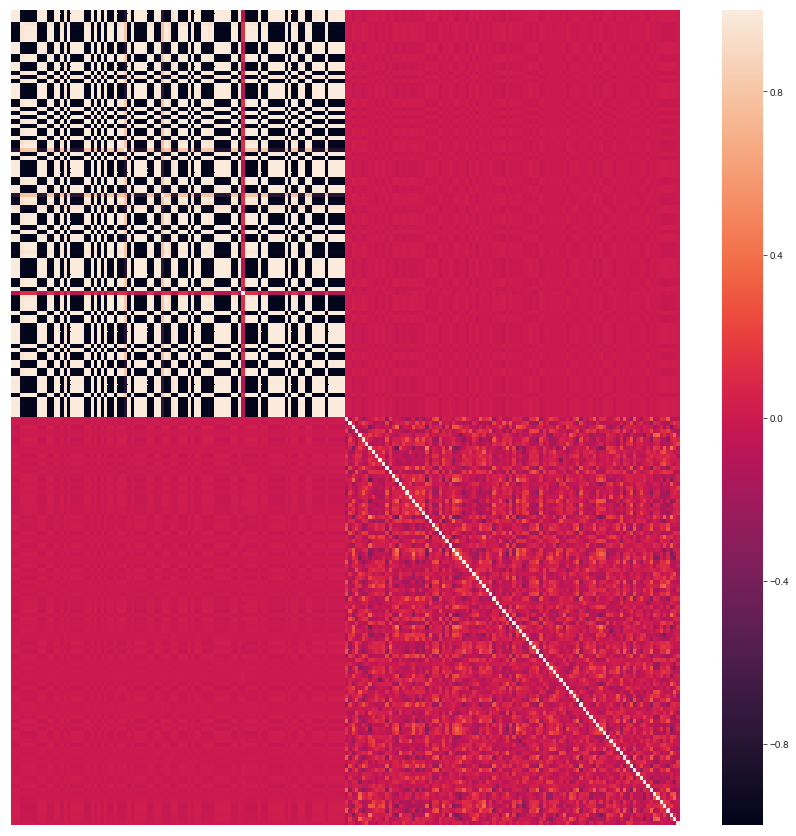

bbb
(200, 200)


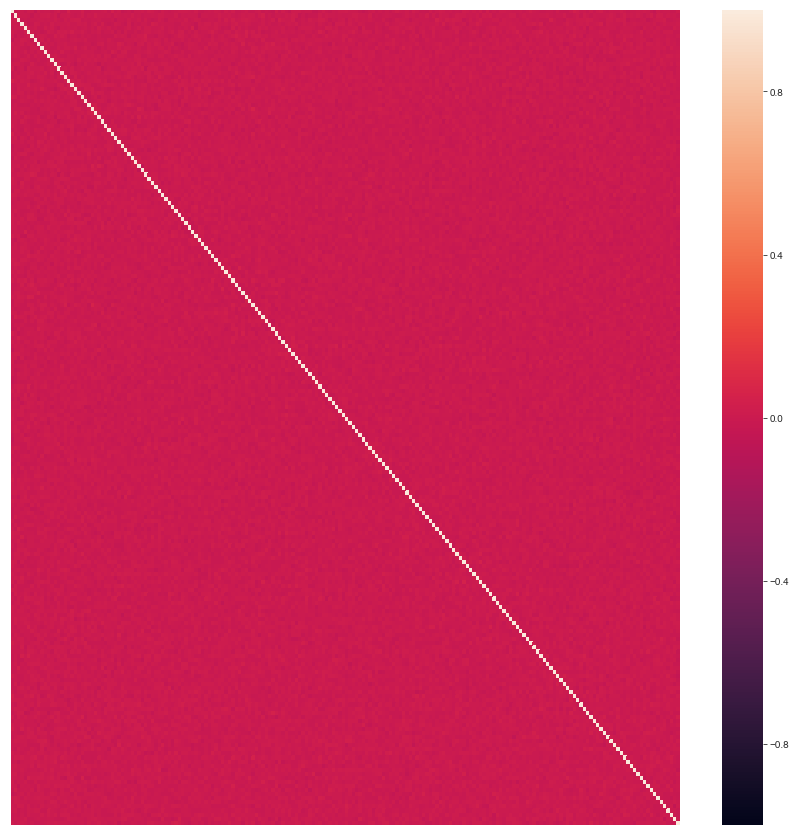

implicit_fullnoise
(200, 200)


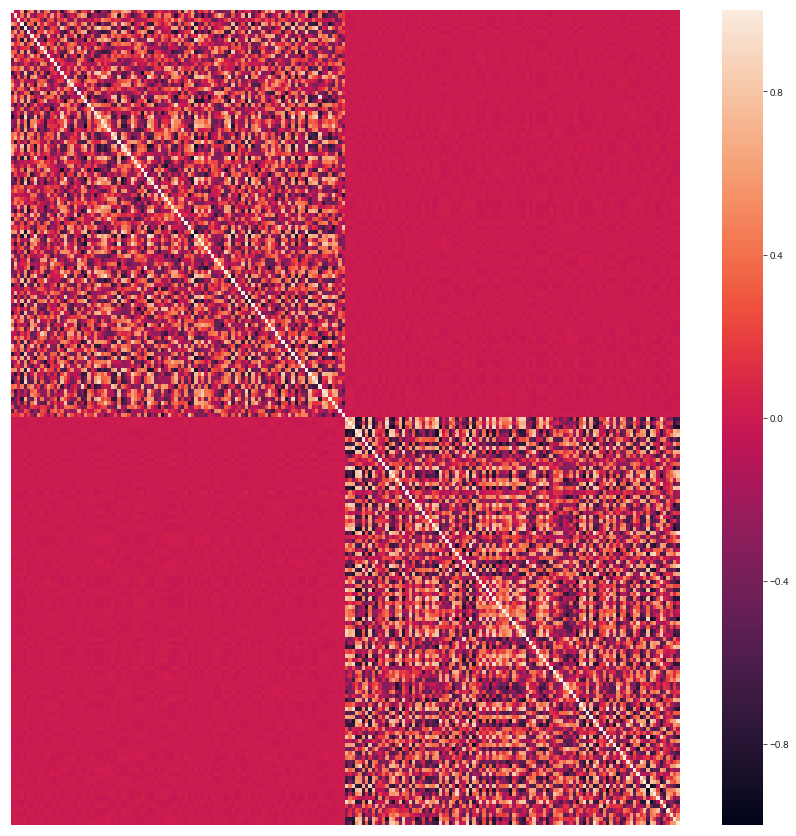

implicit_fullkl
(200, 200)


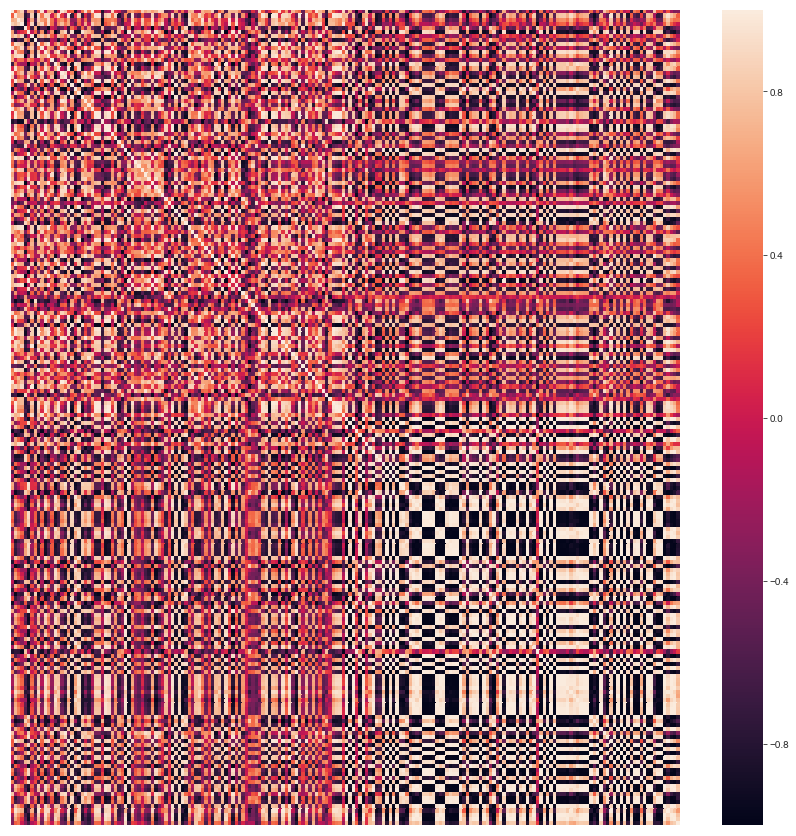

hmc
(200, 200)


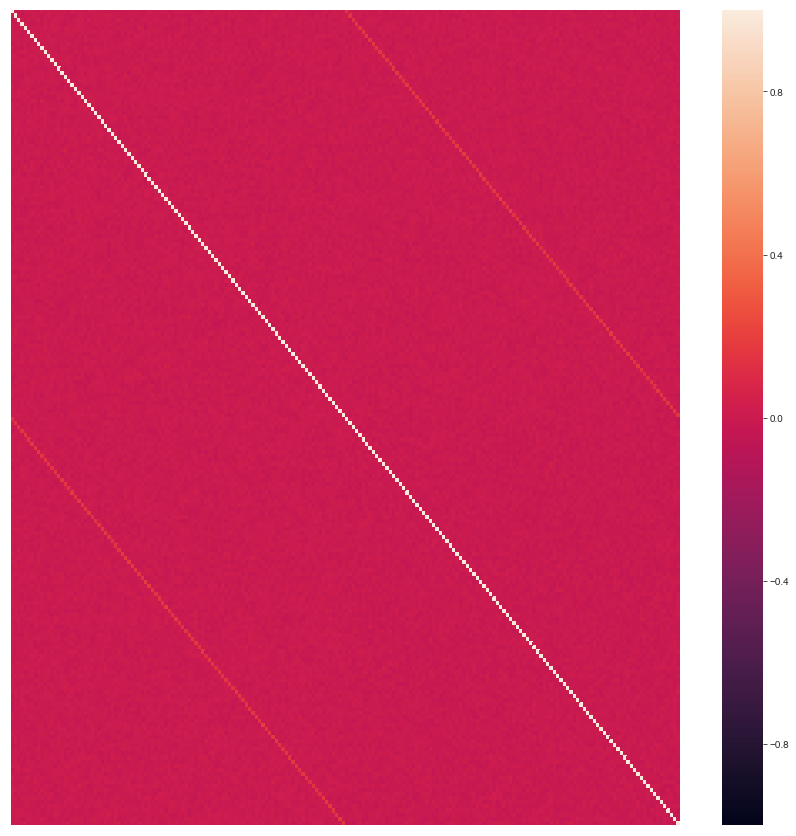

In [28]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for key in weight_dict.keys():
        print(key)
        if key == 'MAP' or key == 'vanilla':
            continue
        weight_dist = np.squeeze(np.array(weight_dict[key]))

        w_df = pd.DataFrame(data=weight_dist)
        corr_df = w_df.corr()
        print(corr_df.shape)
        plt.figure(figsize=(15, 15))
        sns.heatmap(corr_df, vmin=-1, vmax=1.)
        plt.xticks([])
        plt.yticks([])
        plt.show()

In [28]:
w_df.shape

(10000, 200)

In [ ]:
n = tf.shape(gen_weights)[0]
mu = tf.ones((n, ))

f1 = tf.concat([tf.ones((tf.cast((n * (n + 1)) / 2 - 100, tf.int32),)), tf.zeros((100,))], 0)
scale_tril1 = tf.eye(n) + tfd.fill_triangular(f1)
d1 = tfd.MultivariateNormalTriL(loc=mu, scale_tril=scale_tril1)

f2 = tf.concat([tf.zeros((tf.cast((n * (n + 1)) / 2 - 100, tf.int32),)), tf.ones((100,))], 0)
scale_tril2 = tf.eye(n) + tfd.fill_triangular(f2)
d2 = tfd.MultivariateNormalTriL(loc=-1 * mu, scale_tril=scale_tril2)

tfd = tfp.distributions
mix = 0.5
bimix_gauss = tfd.Mixture(
  cat=tfd.Categorical(probs=[mix, 1.-mix]),
  components=[
    d1, d2
])
prior_samples = tf.transpose(bimix_gauss.sample(num_samples), [1, 0])

w1


/homes/np716/.virtualenvs/python2.7/local/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


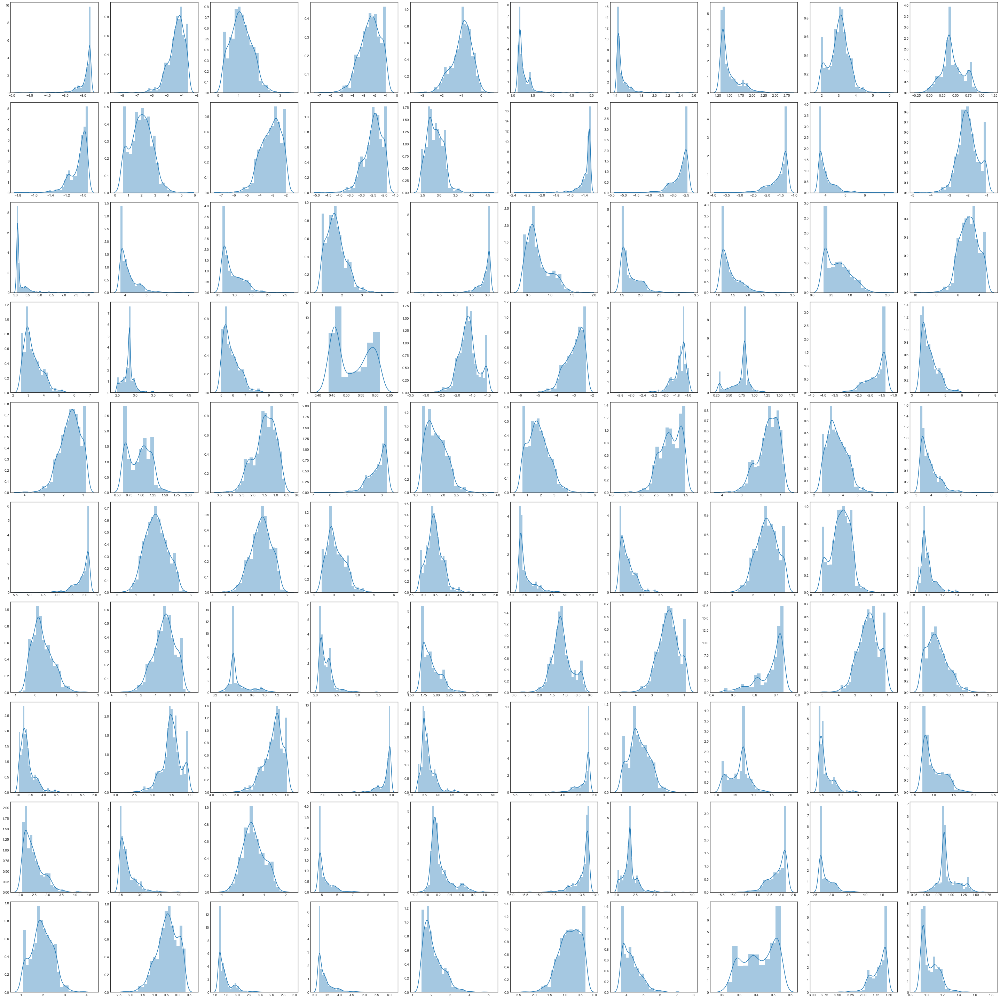

b1


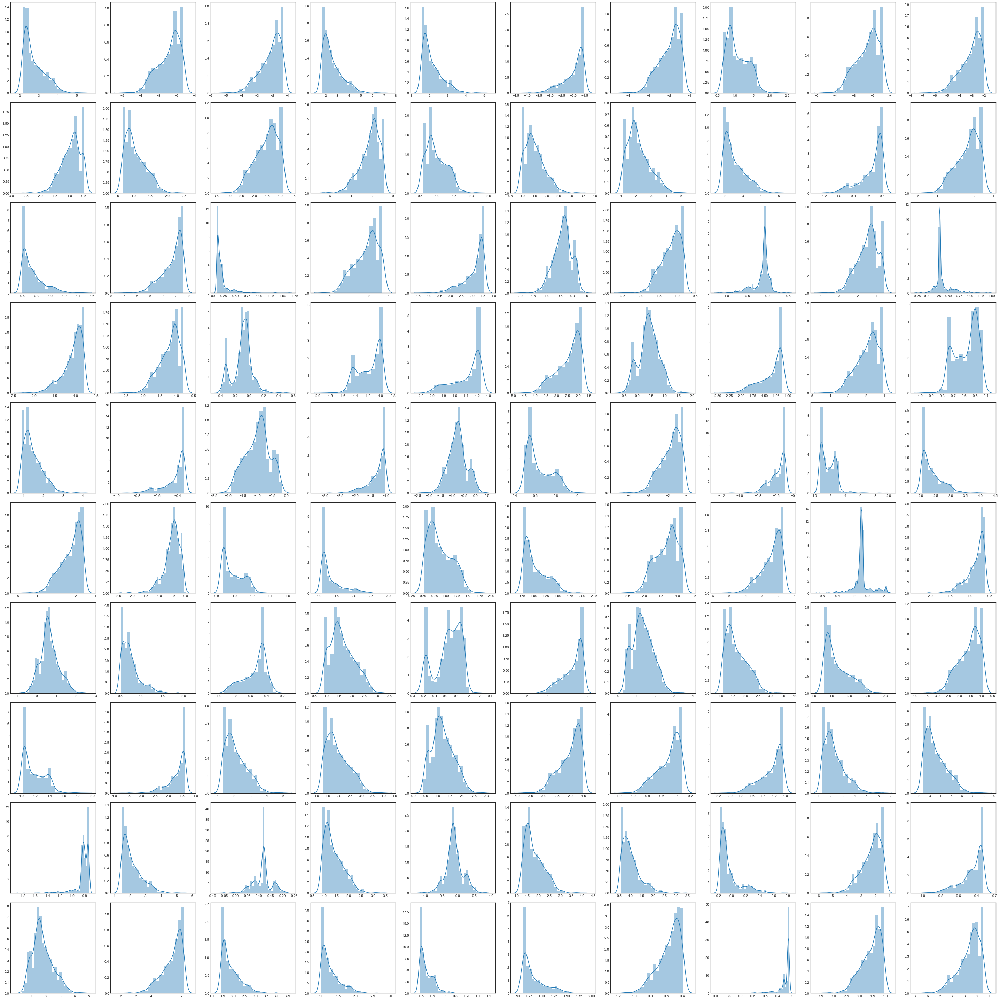

w2


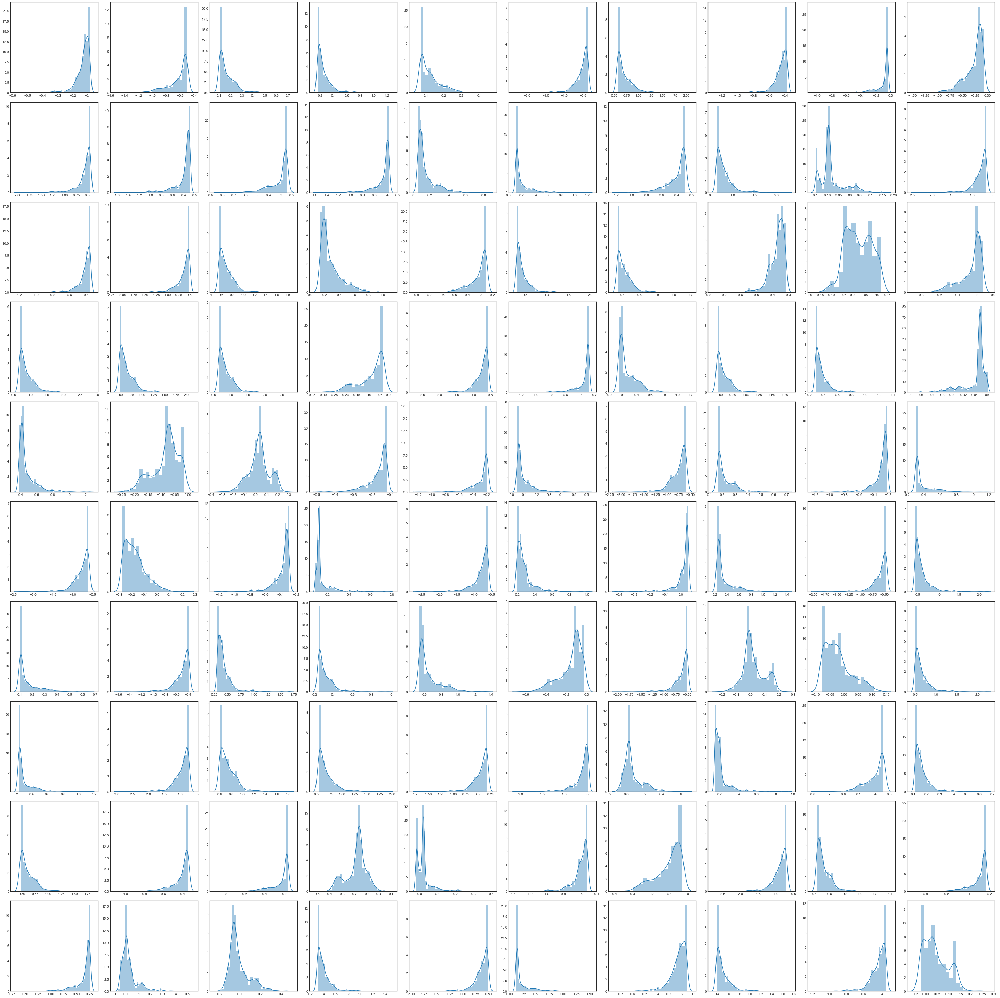

b2


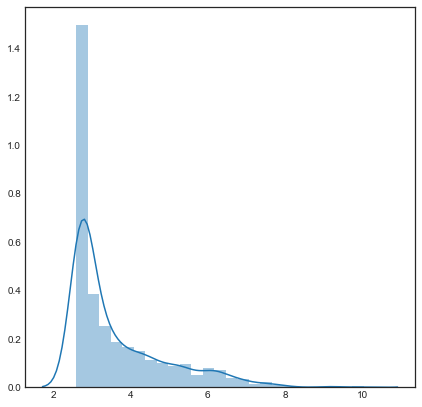

In [14]:
mapping = {0: 'w1', 1: 'b1', 2: 'w2', 3: 'b2'}
for key in weight_dict.keys():
    print(mapping[key])
    weight_dist = np.squeeze(np.array(weight_dict[key]))
    if len(weight_dist.shape) == 1:
        plt.figure(figsize=(7, 7))
        sns.distplot(weight_dist)
        plt.show()
    else:
        fig, axes = plt.subplots(10, 10, figsize=(40, 40), sharey=False)
        for i in range(100):
            row = i // 10
            col = i % 10
            
            sns.distplot(weight_dist[:, i], ax=axes[row, col])
        plt.tight_layout()
        plt.show()

In [15]:
prediction_df.to_csv('toy_example.csv')

try:
    import cPickle as pickle
except:
    import pickle
    
with open('toy_bbh_weight.pickle', 'wb') as f:
    pickle.dump(weight_dict, f)

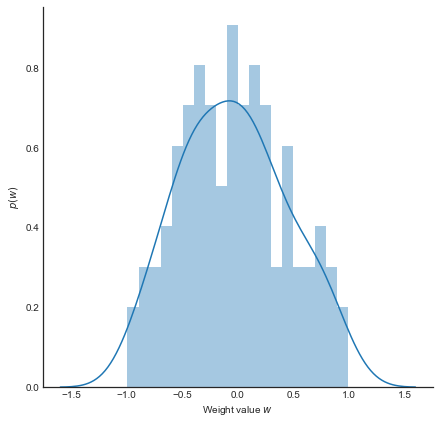

In [16]:
plt.figure(figsize=(7, 7))
sns.distplot(weight_dict[2][-3], bins=20)
sns.despine()
plt.xlabel('Weight value $w$')
plt.ylabel('$p(w)$')
plt.show()

In [16]:
### plot for paper

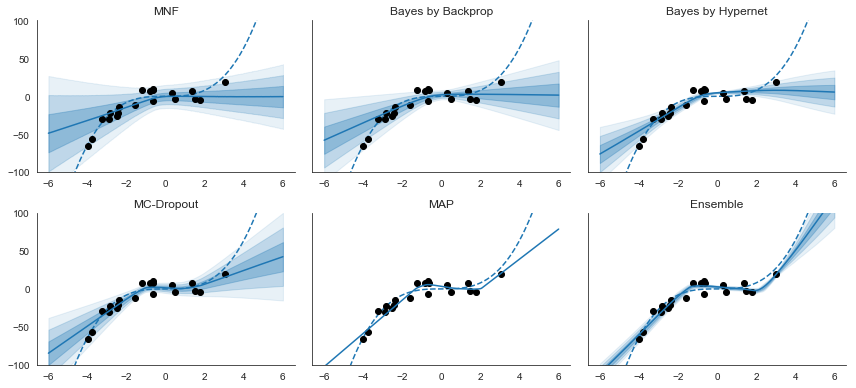

In [31]:
exps_small = {'mnf': 'MNF',
 'bbb': 'Bayes by Backprop',
 'implicit_fullkl': 'Bayes by Hypernet',
 'dropout': 'MC-Dropout',
 'vanilla': 'MAP',
 'ensemble': 'Ensemble'}

fig, axes = plt.subplots(2, 3, figsize=(12, 5.5), sharey=True)
for i, (mode, label) in enumerate(exps_small.items()):
    row = i // 3
    col = i % 3
    #axes[row, col].set_title(label)
    axes[row, col].plot(linspace, linspace ** 3, '--', label='Real function')
    axes[row, col].plot(data_x, data_y, 'o', color='black', label='Samples')
    
    mode_df = prediction_df[prediction_df['mode'] == mode]
    groups = mode_df.groupby(['x'])
    mean_pred = groups.mean().values[:, 0]
    std_pred = groups.std().values[:, 0]
    axes[row, col].plot(linspace, mean_pred, color=colours[0], label=label)
    
    if not mode == 'vanilla':
        axes[row, col].fill_between(linspace,
                         mean_pred + 1 * std_pred,
                         mean_pred - 1 * std_pred,
                         color=colours[0], alpha=0.3)
        axes[row, col].fill_between(linspace,
                         mean_pred + 2 * std_pred,
                         mean_pred - 2 * std_pred,
                         color=colours[0], alpha=0.2)
        axes[row, col].fill_between(linspace,
                         mean_pred + 3 * std_pred,
                         mean_pred - 3 * std_pred,
                         color=colours[0], alpha=0.1)
    
    axes[row, col].set_title(label, size='larger')
    # l = axes[row, col].legend(loc=0)
    # l.set_title('')
plt.ylim(-100, 100)
sns.despine()
plt.tight_layout()
plt.show()

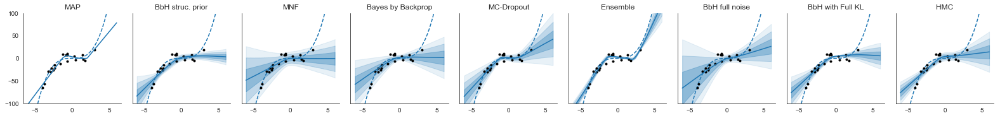

In [32]:
exps = {
    'vanilla': 'MAP', 'implicit_fullkl_structured': 'BbH struc. prior',
    'mnf': 'MNF',
    'bbb': 'Bayes by Backprop', 
    'dropout': 'MC-Dropout', 'ensemble': 'Ensemble',
    'implicit_fullnoise': 'BbH full noise',
    'implicit_fullkl': 'BbH with Full KL',
    'hmc': 'HMC'
    }

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fig, axes = plt.subplots(1, 9, figsize=(22, 2.7), sharey=True)
    for i, (mode, label) in enumerate(exps.items()):
        axes[i].set_title(label)
        axes[i].plot(linspace, linspace ** 3, '--', label='Real function')
        axes[i].plot(data_x, data_y, '.', color='black', label='Samples')

        mode_df = prediction_df[prediction_df['mode'] == mode]
        groups = mode_df.groupby(['x'])
        mean_pred = groups.mean().as_matrix()[:, 0]
        std_pred = groups.std().as_matrix()[:, 0]
        axes[i].plot(linspace, mean_pred, color=colours[0], label=label)

        if not mode == 'vanilla':
            axes[i].fill_between(linspace,
                             mean_pred + 1 * std_pred,
                             mean_pred - 1 * std_pred,
                             color=colours[0], alpha=0.3)
            axes[i].fill_between(linspace,
                             mean_pred + 2 * std_pred,
                             mean_pred - 2 * std_pred,
                             color=colours[0], alpha=0.2)
            axes[i].fill_between(linspace,
                             mean_pred + 3 * std_pred,
                             mean_pred - 3 * std_pred,
                             color=colours[0], alpha=0.1)
        
    #l = axes[i].legend(loc=0)
    #l.set_title(label)
plt.ylim(-100, 100)
sns.despine()
plt.tight_layout()
plt.show()

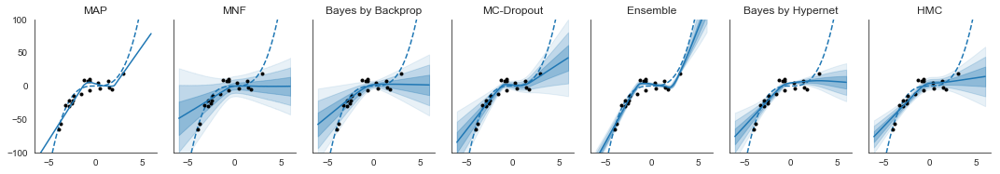

In [30]:
exps = {
    'vanilla': 'MAP',
    #'implicit_fullkl_structured': 'Bayes by Hypernet',
    'mnf': 'MNF',
    'bbb': 'Bayes by Backprop', 
    'dropout': 'MC-Dropout', 'ensemble': 'Ensemble',
    #'implicit_fullnoise': 'Bayes by Hypernet with Full Noise',
    'implicit_fullkl': 'Bayes by Hypernet',
    'hmc': 'HMC'
    }

fig, axes = plt.subplots(1, 7, figsize=(15, 2.7), sharey=True)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for i, (mode, label) in enumerate(exps.items()):
        axes[i].set_title(label)
        axes[i].plot(linspace, linspace ** 3, '--', label='Real function')
        axes[i].plot(data_x, data_y, '.', color='black', label='Samples')

        mode_df = prediction_df[prediction_df['mode'] == mode]
        groups = mode_df.groupby(['x'])
        mean_pred = groups.mean().as_matrix()[:, 0]
        std_pred = groups.std().as_matrix()[:, 0]
        axes[i].plot(linspace, mean_pred, color=colours[0], label=label)

        if not mode == 'vanilla':
            axes[i].fill_between(linspace,
                             mean_pred + 1 * std_pred,
                             mean_pred - 1 * std_pred,
                             color=colours[0], alpha=0.3)
            axes[i].fill_between(linspace,
                             mean_pred + 2 * std_pred,
                             mean_pred - 2 * std_pred,
                             color=colours[0], alpha=0.2)
            axes[i].fill_between(linspace,
                             mean_pred + 3 * std_pred,
                             mean_pred - 3 * std_pred,
                             color=colours[0], alpha=0.1)

        #l = axes[i].legend(loc=0)
        #l.set_title(label)
    plt.ylim(-100, 100)
    sns.despine()
    plt.tight_layout()
    plt.show()